In [1]:
!pip install segmentation-models

  Using cached segmentation_models-1.0.1-py3-none-any.whl (33 kB)
  Using cached efficientnet-1.0.0-py3-none-any.whl (17 kB)
  Using cached image_classifiers-1.0.0-py3-none-any.whl (19 kB)
  Using cached scikit_image-0.17.2-cp36-cp36m-manylinux1_x86_64.whl (12.4 MB)
  Using cached PyWavelets-1.1.1-cp36-cp36m-manylinux1_x86_64.whl (4.4 MB)
  Using cached networkx-2.4-py3-none-any.whl (1.6 MB)
  Using cached tifffile-2020.5.30-py3-none-any.whl (133 kB)
  Using cached imageio-2.8.0-py3-none-any.whl (3.3 MB)
  Using cached matplotlib-3.2.1-cp36-cp36m-manylinux1_x86_64.whl (12.4 MB)
  Using cached cycler-0.10.0-py2.py3-none-any.whl (6.5 kB)
  Using cached kiwisolver-1.2.0-cp36-cp36m-manylinux1_x86_64.whl (88 kB)
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [2]:
!pip install matplotlib
!pip install numpy
!pip install scikit-image

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [3]:
!pip install plotly
!pip install nbformat

  Using cached plotly-4.8.1-py2.py3-none-any.whl (11.5 MB)
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
  Using cached nbformat-5.0.6-py3-none-any.whl (170 kB)
  Using cached jsonschema-3.2.0-py2.py3-none-any.whl (56 kB)
  Using cached attrs-19.3.0-py2.py3-none-any.whl (39 kB)
Processing ./.cache/pip/wheels/d1/8a/1c/32ab9017418a2c64e4fbaf503c08648bed2f8eb311b869a464/pyrsistent-0.16.0-cp36-cp36m-linux_x86_64.whl
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [4]:
PATH = "./shipdetection/"
TRAIN_PATH = PATH + "train_v2/"
TEST_PATH = PATH + "test_v2/"

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import os

# from kmader
import gc; gc.enable() # memory is tight

In [5]:
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_encode(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def rle_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    if type(mask_rle) != str:
        return np.zeros(shape)
    else:
        s = mask_rle.split()
        starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
        starts -= 1
        ends = starts + lengths
        img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
        for lo, hi in zip(starts, ends):
            img[lo:hi] = 1
        return img.reshape(shape).T  # Needed to align to RLE direction


masks = pd.read_csv(PATH + "train_ship_segmentations_v2.csv")

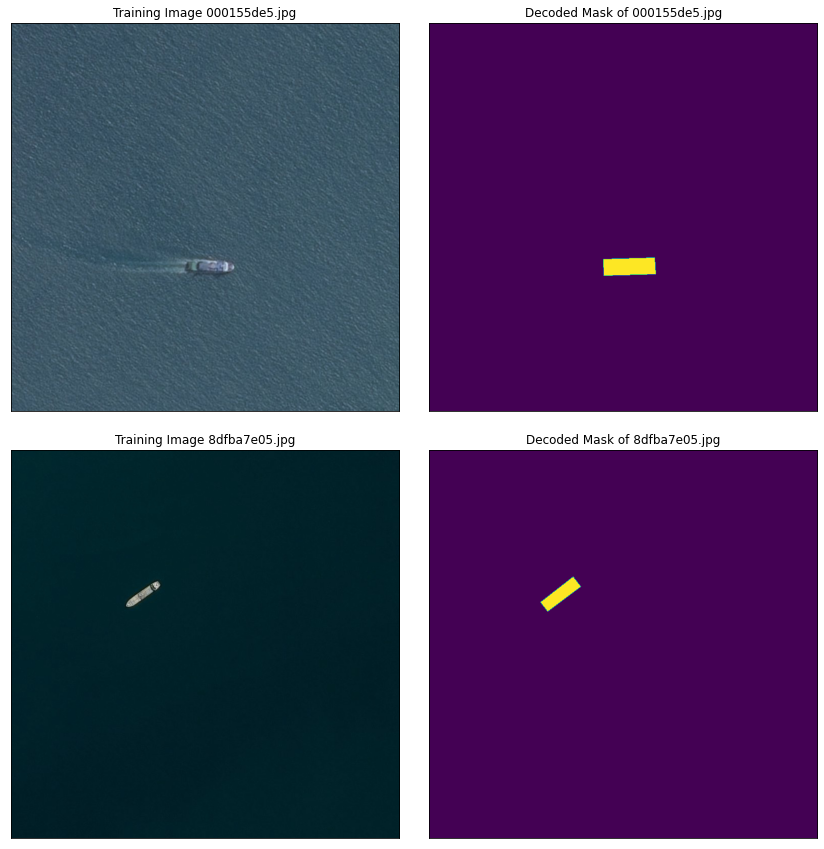

In [6]:
#%% check decode


#plt.imshow(test_img)
#plt.imshow(decode, alpha = 0.4)

#img, mask = next(in_gen)
fig = plt.figure(figsize = (15,15))
plt.subplots_adjust(wspace=0, hspace=0.1)

test_img = skimage.io.imread(PATH + 'train_v2/000155de5.jpg')
ax1 = plt.subplot(2, 2, 1)
ax1.imshow(test_img)
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
ax1.set_title('Training Image 000155de5.jpg')

test_mask = masks.loc[masks['ImageId'] == '000155de5.jpg']['EncodedPixels']
decode = rle_decode(test_mask.iloc[0])
ax2 = plt.subplot(2, 2, 2)
ax2.imshow(decode)
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)
ax2.set_title('Decoded Mask of 000155de5.jpg')


test_img = skimage.io.imread(PATH + 'train_v2/8dfba7e05.jpg')
ax1 = plt.subplot(2, 2, 3)
ax1.imshow(test_img)
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
ax1.set_title('Training Image 8dfba7e05.jpg')

test_mask = masks.loc[masks['ImageId'] == '8dfba7e05.jpg']['EncodedPixels']
decode = rle_decode(test_mask.iloc[0])
ax2 = plt.subplot(2, 2, 4)
ax2.imshow(decode)
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)
ax2.set_title('Decoded Mask of 8dfba7e05.jpg')

fig.savefig('training_images_with_masks.png', bbox_inches='tight')

In [ ]:
#%% MERGE IMAGE LAYERS WITH MULTIPLE SHIPS


masks['count'] = masks.groupby('ImageId')['EncodedPixels'].transform('count')
masks.set_index('ImageId', inplace = True)
mu = masks[masks['count'] <= 1]
mm = masks[masks['count'] > 1]
n = 0 
for mult in mm.index.unique():
    if n % 100 == 0 : print(n)
    combined = np.zeros((768, 768))
    dfm = mm.loc[mult,:]
    for i, row in dfm.iterrows():
        d = rle_decode(row['EncodedPixels'])
        combined = np.maximum(combined, d)
    new_row = row
    new_row['EncodedPixels'] = rle_encode(combined)
    mu = mu.append(new_row)
    n += 1

mu.reset_index(inplace = True)    
m0 = mu[mu['count'] == 0].iloc[0,:]
m1 = mu[mu['count'] == 1].iloc[0,:]
m2 = mu[mu['count'] == 2].iloc[0,:]
m5 = mu[mu['count'] == 5].iloc[0,:]

m0_img = skimage.io.imread(TRAIN_PATH + m0['ImageId'])
m1_img = skimage.io.imread(TRAIN_PATH + m1['ImageId'])
m2_img = skimage.io.imread(TRAIN_PATH + m2['ImageId'])
m5_img = skimage.io.imread(TRAIN_PATH + m5['ImageId'])

from skimage.util import montage

# montage_img = montage([m0_img, m1_img, m2_img, m5_img])
# plt.imshow(montage_img)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2)
plt.tight_layout()

ax1.imshow(m0_img)
ax1.imshow(rle_decode(m0['EncodedPixels']), alpha = 0.5)

ax2.imshow(m1_img)
ax2.imshow(rle_decode(m1['EncodedPixels']), alpha = 0.5)

ax3.imshow(m2_img)
ax3.imshow(rle_decode(m2['EncodedPixels']), alpha = 0.5)

ax4.imshow(m5_img)
ax4.imshow(rle_decode(m5['EncodedPixels']), alpha = 0.5)

In [ ]:
# remove corrupted files

mu['file_size_kb'] = mu['ImageId'].map(lambda c_img_id: 
                                        os.stat(os.path.join(PATH+'train_v2/', 
                                        c_img_id)).st_size/1024)
mu = mu[mu['file_size_kb']>50] # keep only 50kb files

# SAVE HERE!


In [7]:
#mu.to_csv('df_train_processed.csv')
mu2 = pd.read_csv('df_train_processed.csv')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


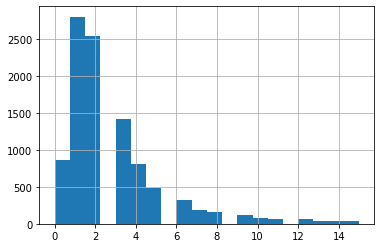

In [8]:
#%% SAMPLE    


from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(mu2, test_size = 0.5, shuffle=True, random_state = 51)

weights = [0.001,0.02,0.1,4,5,6,7,8,9,10,11,12,13,14,15,16]

df_train['weights'] = df_train['count'].map(lambda c : weights[c])

df_train['freq'] = df_train.groupby('count')['count'].transform('count')

df_sample = df_train.sample(n = 10000, weights = df_train['weights'], random_state = 17)
df_sample_test = df_test.sample(n = 10000, random_state = 24)

df_sample['count'].hist(bins=20)

In [9]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
#import nbformat

#data_canada = px.data.gapminder().query("country == 'Canada'")


fig = make_subplots(1, 2, subplot_titles=['Training Data Ship Count','Balanced Sampling Ship Count'])

fig.add_trace(go.Histogram(x = df_train['count']), 1, 1)
fig.add_trace(go.Histogram(x = df_sample['count']), 1, 2)

fig.update_xaxes(title_text="Ship Count", row=1, col=1)
fig.update_xaxes(title_text="Ship Count", row=1, col=2)

fig.update_yaxes(title_text="Frequency", row=1, col=1)
#fig.update_yaxes(title_text="Frequency", row=1, col=2)

fig.update_layout(showlegend=False, margin=dict(l=0, r=0, t=30, b=0))

fig.write_html("ship_count_histograms.html", include_plotlyjs = 'cdn')
#fig.show()

In [10]:
#%% create simple generator

def image_gen(df, show = False, print_name = False):
    images = list(df['ImageId'])
    masks = list(df['EncodedPixels'])
    i = 0
    while i < len(images):
        if print_name:
            print(images[i])
        img = skimage.io.imread(TRAIN_PATH + images[i])
        mask = np.reshape(rle_decode(masks[i]),(768,768,1))
        if show == True:
            plt.imshow(img)
            plt.imshow(mask, alpha = 0.4)
        yield (np.array([img/255]), np.array([mask]))
        i += 1
        
def image_gen_batch(df, batch_size = 1):
    images = np.array(df['ImageId'])
    masks = np.array(df['EncodedPixels'])
    ind = np.arange(len(images))
    np.random.shuffle(ind)
    images = images[ind]
    masks = masks[ind]
    i = 0
    while True:
        batch_img = []
        batch_mask = []
        for x in np.arange(batch_size):
            if i == len(images):
                # loop to beginning and re-shuffle
                i = 0
                np.random.shuffle(ind)
                images = images[ind]
                masks = masks[ind]
            batch_img.append(skimage.io.imread(TRAIN_PATH + images[i])/255.0)
            batch_mask.append(np.reshape(rle_decode(masks[i]),(768,768,1)))
            i += 1
        #img = skimage.io.imread(TRAIN_PATH + images[i])
        #mask = np.reshape(rle_decode(masks[i]),(768,768,1))
        yield (np.array(batch_img), np.array(batch_mask))
        #i += 1
        
        

(4, 768, 768, 3) (4, 768, 768, 1)


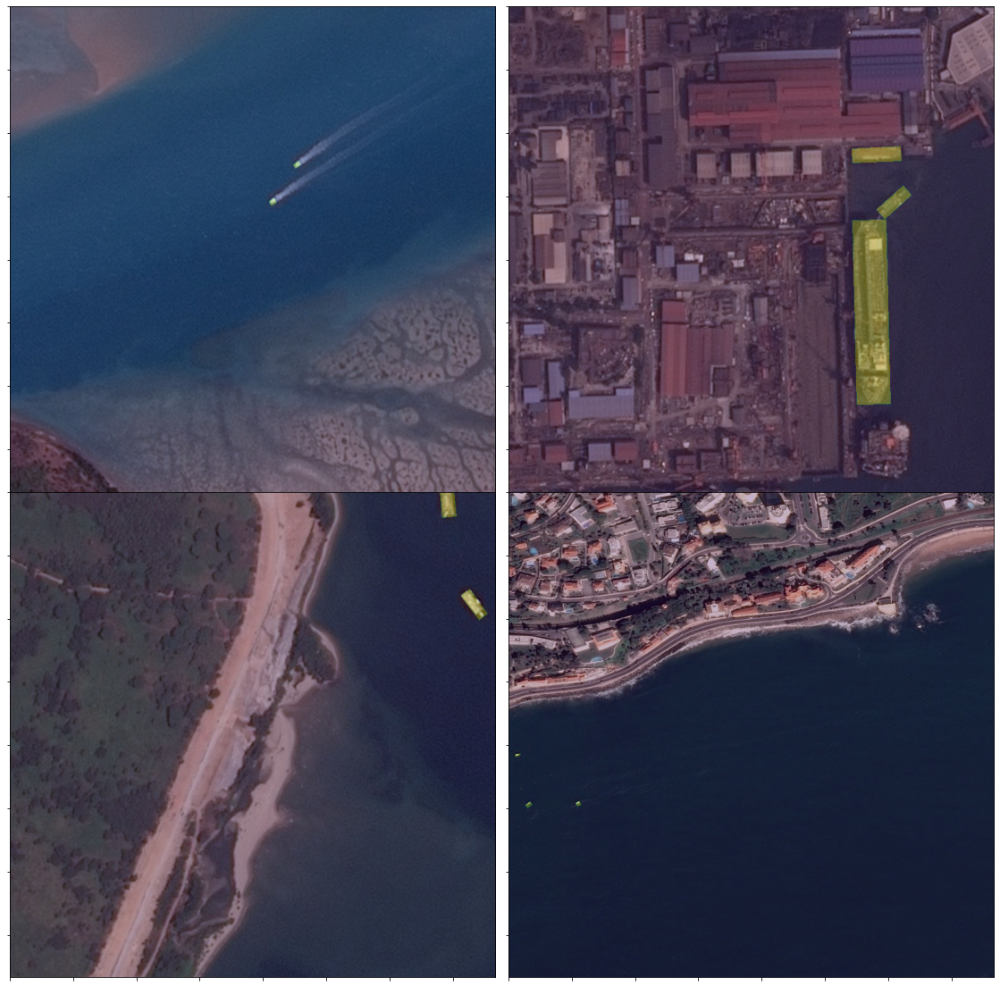

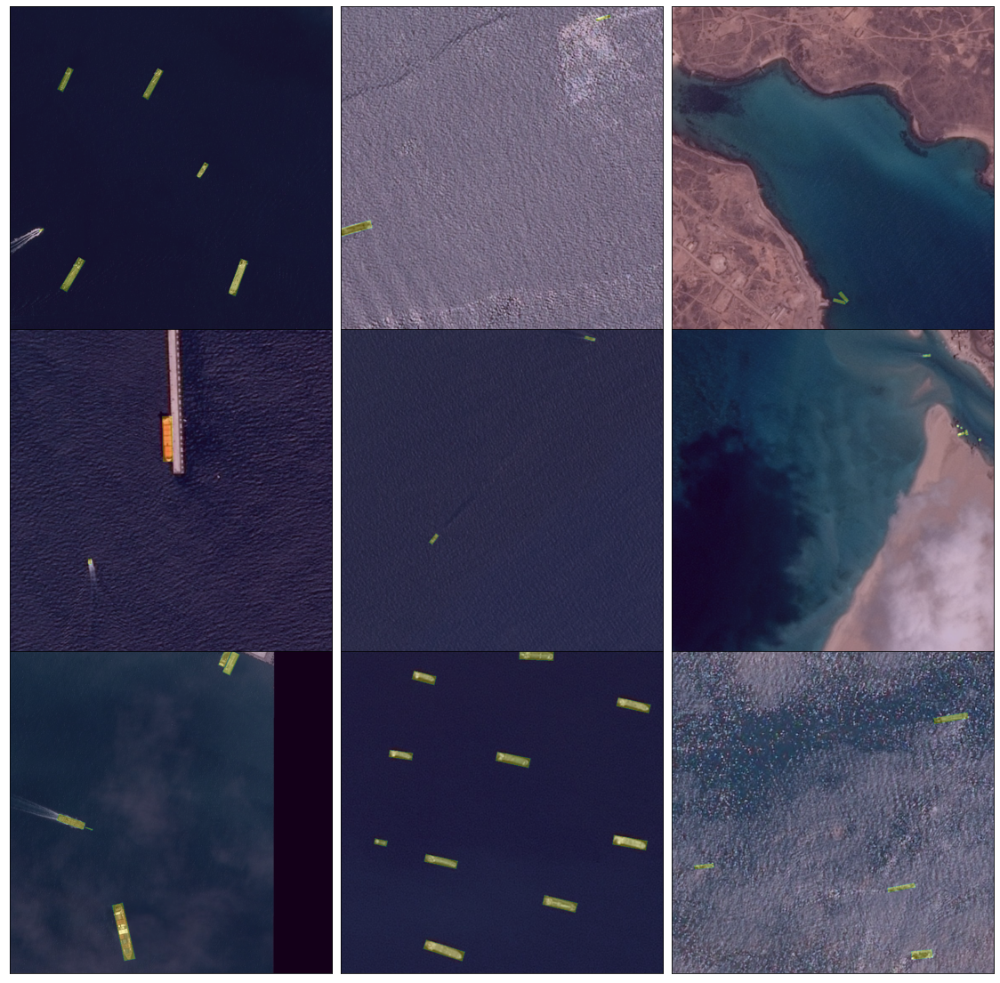

In [11]:
train_gen = image_gen_batch(df_sample, batch_size = 4)
X_train, y_train = next(train_gen)
print(np.shape(X_train), np.shape(y_train))

# revise this with more concise and generalizable code
# https://theailearner.com/2019/07/06/imagedatagenerator-flow-method/

def plot_img_batch(img, mask):
    fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize = (20,20))
    plt.subplots_adjust(wspace=0, hspace=0)
    ax1.imshow(img[0])
    ax1.imshow(np.reshape(mask[0],(768,768)), alpha = 0.3)
    ax1.set_yticklabels([])
    ax1.set_xticklabels([])

    ax2.imshow(img[1])
    ax2.imshow(np.reshape(mask[1],(768,768)), alpha = 0.3)
    ax2.set_yticklabels([])
    ax2.set_xticklabels([])

    ax3.imshow(img[2])
    ax3.imshow(np.reshape(mask[2],(768,768)), alpha = 0.3)
    ax3.set_yticklabels([])
    ax3.set_xticklabels([])

    ax4.imshow(img[3])
    ax4.imshow(np.reshape(mask[3],(768,768)), alpha = 0.3)
    ax4.set_yticklabels([])
    ax4.set_xticklabels([])
    
def plot_img_batch2(in_gen, nrows = 1, ncols = 1):
    img, mask = next(in_gen)
    fig = plt.figure(figsize = (20,20))
    plt.subplots_adjust(wspace=0, hspace=0)
    for i in np.arange(nrows*ncols):
        ax = plt.subplot(nrows, ncols, i+1)
        ax.imshow(img[i])
        ax.imshow(np.reshape(mask[i],(768,768)), alpha = 0.3)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
    return fig

plot_img_batch(X_train,y_train)


test_gen = image_gen_batch(df_test[df_test['count']>3], batch_size = 4)
X_test, y_test = next(test_gen)

fig = plot_img_batch2(image_gen_batch(df_sample[df_sample['count'] >= 2], batch_size = 9), nrows = 3, ncols = 3)
fig.savefig('images_with_multiple_ships.png',  bbox_inches='tight')

Using TensorFlow backend.


(12, 768, 768, 3)
(12, 768, 768, 1)


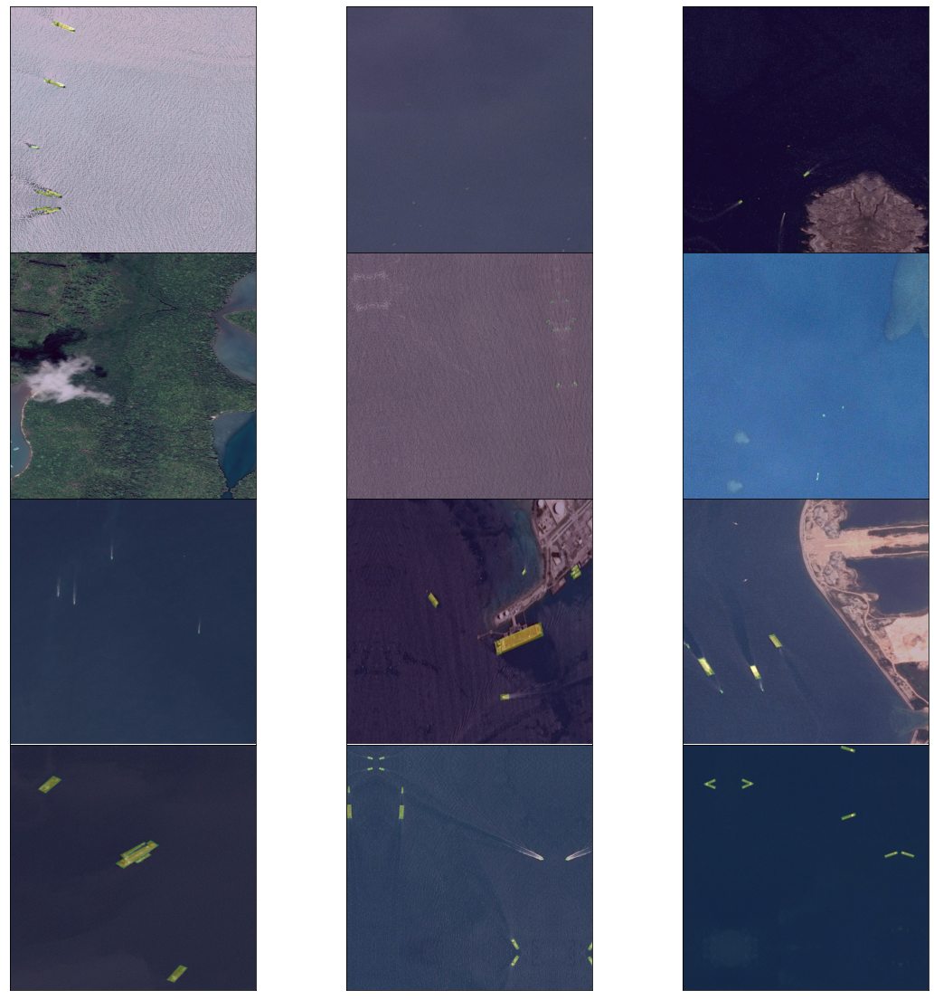

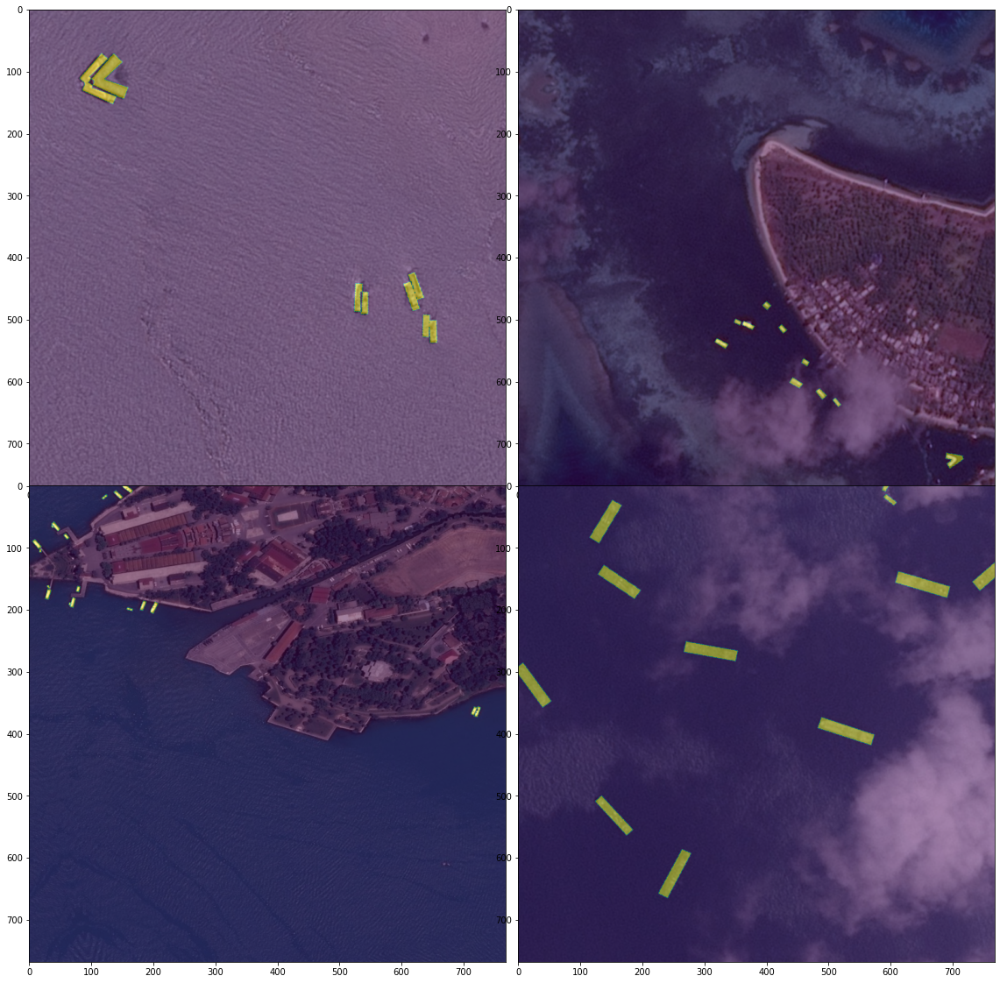

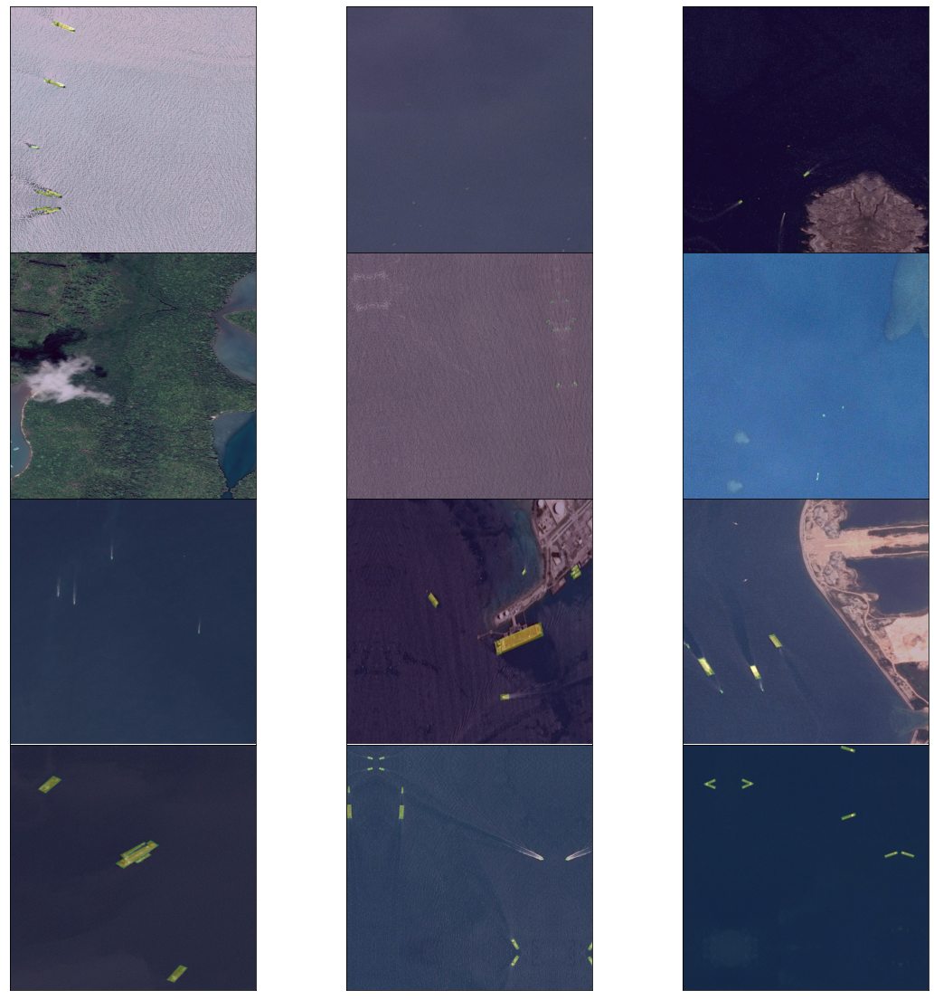

In [12]:
#%% add augmentation

from keras.preprocessing.image import ImageDataGenerator

dg_args = dict(featurewise_center = False, 
                  samplewise_center = False,
                  rotation_range = 15, 
                  width_shift_range = 0.1, 
                  height_shift_range = 0.1, 
                  shear_range = 0.01,
                  zoom_range = [0.5, 1.5],  
                  horizontal_flip = True, 
                  vertical_flip = True,
                  fill_mode = 'reflect',
                  data_format = 'channels_last',
                  brightness_range = [0.5, 1.5])

im_gen = ImageDataGenerator(**dg_args)

dg_args.pop('brightness_range')
mask_gen = ImageDataGenerator(**dg_args)

def aug_gen(in_gen):
    seed = 57
    for in_x, in_y in in_gen:
        #seed = 5#np.random.choice(range(9999))
        # keep the seeds syncronized otherwise the augmentation to the images is different from the masks
        g_x = im_gen.flow(255*in_x, 
                             batch_size = in_x.shape[0], 
                             seed = seed, 
                             shuffle=False)
        g_y = mask_gen.flow(in_y, 
                             batch_size = in_y.shape[0], 
                             seed = seed, 
                             shuffle=False)
        yield next(g_x)/255.0, next(g_y)
        
def aug_gen2(in_gen):
    seed = np.random.choice(range(9999))
    for in_x, in_y in in_gen:
        seed = np.random.choice(range(9999))
        # keep the seeds syncronized otherwise the augmentation to the images is different from the masks
        img_aug = []
        mask_aug = []
        for i in np.arange(np.shape(in_x)[0]):
            seed = np.random.choice(range(9999))
            # keep the seeds syncronized otherwise the augmentation to the images is different from the masks
            g_x = im_gen.flow(255.0*np.array([in_x[i]]), 
                                 batch_size = 1, 
                                 seed = seed, 
                                 shuffle=True)
            g_y = mask_gen.flow(np.array([in_y[i]]), 
                                 batch_size = 1, 
                                 seed = seed, 
                                 shuffle=True)
            img_aug.append(next(g_x)/255.0)
            mask_aug.append(next(g_y))
            #img_aug = np.concatenate(img_aug, next(g_x)/255.0)
            #mask_aug = np.concatenate(mask_aug, next(g_y))
        yield np.array(img_aug)[:,0,:,:,:], np.array(mask_aug)[:,0,:,:,:]
        

# img_gen2 doesn't have brightness augmentation
im_gen2 = ImageDataGenerator(**dg_args)
     
def aug_gen3(in_gen):
    seed = 57
    for in_x, in_y in in_gen:
        #seed = 5#np.random.choice(range(9999))
        # keep the seeds syncronized otherwise the augmentation to the images is different from the masks
        print("in_x: ", np.shape(in_x))
        g = im_gen2.flow(255*in_x,
                              y = in_y,
                              batch_size = 4, 
                              seed = seed, 
                              shuffle=False)
        g_x, g_y = next(g)
        yield g_x/255.0, g_y
        


        

    
test_aug = aug_gen(image_gen(df_sample[df_sample['count'] > 5]))

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize = (20,20))

#plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)

tax1, tay1 = next(test_aug)
ax1.imshow(tax1[0])
ax1.imshow(np.reshape(tay1[0], (768,768)), alpha = 0.5)

tax2, tay2 = next(test_aug)
ax2.imshow(tax2[0])
ax2.imshow(np.reshape(tay2[0], (768,768)), alpha = 0.5)

tax3, tay3 = next(test_aug)
ax3.imshow(tax3[0])
ax3.imshow(np.reshape(tay3[0], (768,768)), alpha = 0.5)

tax4, tay4 = next(test_aug)
ax4.imshow(tax4[0])
ax4.imshow(np.reshape(tay4[0], (768,768)), alpha = 0.5)


test_aug_batch = aug_gen2(image_gen_batch(df_sample[df_sample['count'] > 2], batch_size = 12))

X_train_aug, y_train_aug = next(test_aug_batch)

print(np.shape(X_train_aug))
print(np.shape(y_train_aug))

plot_img_batch2(test_aug_batch, nrows = 4, ncols = 3)
    
        
# val_datagen = ImageDataGenerator(rescale=1./255)


In [13]:
temp_gen = image_gen_batch(df_sample[df_sample['count'] > 2], batch_size = 1)

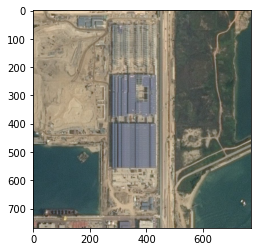

In [14]:
in_x, in_y = next(temp_gen)
plt.imshow(in_x[0])

In [15]:
test_aug_batch2 = aug_gen2(image_gen_batch(mu2[mu2['ImageId']  == 'ffe2fcd0e.jpg'], batch_size = 1))
#img_aug = np.concatenate(img_aug, next(g_x)/255.0)
#mask_aug = np.concatenate(mask_aug, next(g_y))

In [16]:
mu2[mu2['ImageId']  == 'ffe2fcd0e.jpg']
#mu2

,Unnamed: 0,ImageId,EncodedPixels,count,file_size_kb
191284,192551,ffe2fcd0e.jpg,140499 1 141266 3 142033 5 142800 7 143566 9 1...,4,147.257812


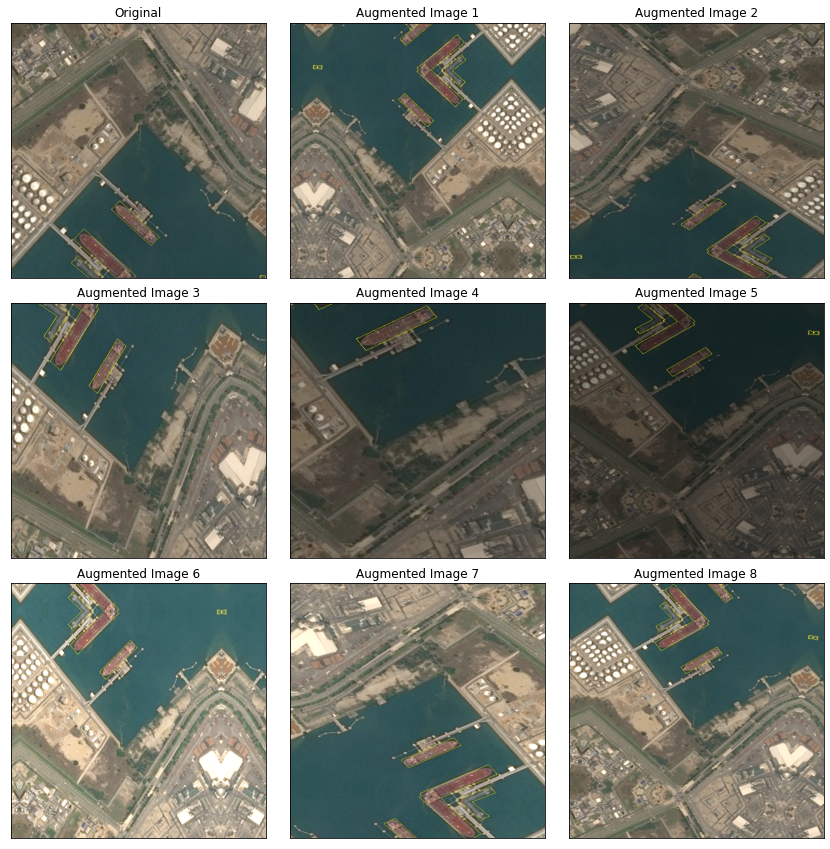

In [18]:
from skimage.segmentation import mark_boundaries

fig = plt.figure(figsize = (15,15))
plt.subplots_adjust(wspace=0, hspace=0.1)

base = skimage.io.imread(PATH + 'train_v2/ffe2fcd0e.jpg')
base_mask = rle_decode(mu2[mu2['ImageId']  == 'ffe2fcd0e.jpg']['EncodedPixels'].iloc[0])
ax = plt.subplot(3, 3, 1)
#ax.imshow(base)
#ax.imshow(base_mask, alpha = 0.5)
ax.imshow(mark_boundaries(base, base_mask.astype(int)))
ax.set_title('Original')
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)



for a in np.arange(2,10):
    aug_x, aug_y = next(test_aug_batch2)
    ax = plt.subplot(3, 3, a)
    #ax.imshow(aug_x[0])
    ax.imshow(mark_boundaries(aug_x[0],
                              np.reshape(aug_y[0],(768,768)).astype(int)))
    ax.set_title('Augmented Image %d' % (a-1))
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    
fig.savefig('augmentation_test.png', bbox_inches = 'tight')

In [19]:
tt = mu2[mu2['ImageId']  == 'ffe2fcd0e.jpg']['EncodedPixels']

#plt.imshow(rle_decode(tt))
type(tt)

pandas.core.series.Series

In [21]:
gc.collect()

2141

In [22]:
#%% create model
#https://towardsdatascience.com/a-keras-pipeline-for-image-segmentation-part-1-6515a421157d
from keras.callbacks import ModelCheckpoint
from keras.callbacks import CSVLogger
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam

#import model9
#model6.reload(unet)

#in_size = (1,768,768,3)
#m = model9.unet(input_size = np.shape(X_train)[1:])
#opt = Adam(lr=1E-5, beta_1=0.9, beta_2=0.999, epsilon=1e-08)


In [ ]:
from segmentation_models import Unet
from segmentation_models import get_preprocessing
from segmentation_models.losses import bce_jaccard_loss
from segmentation_models.metrics import iou_score

BACKBONE = 'resnet34'

# https://github.com/qubvel/segmentation_models/blob/master/segmentation_models/backbones/inception_v3.py
# https://github.com/keras-team/keras-applications/blob/master/keras_applications/imagenet_utils.py
preprocess_input = get_preprocessing(BACKBONE)
#model.compile('Adam', loss=bce_jaccard_loss, metrics=[iou_score])

import keras.backend as K
from keras.optimizers import Adam
from keras.losses import binary_crossentropy

def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)
def dice_p_bce(in_gt, in_pred):
    return 1e-3*binary_crossentropy(in_gt, in_pred) - dice_coef(in_gt, in_pred)
def true_positive_rate(y_true, y_pred):
    return K.sum(K.flatten(y_true)*K.flatten(K.round(y_pred)))/K.sum(y_true)

model = Unet(BACKBONE, encoder_weights='imagenet')
model.compile('Adam', loss=bce_jaccard_loss, metrics=[iou_score])

#model.compile(optimizer=Adam(1e-4, decay=1e-6), loss=dice_p_bce,
#              metrics=[dice_coef, 'binary_accuracy', true_positive_rate])


def image_gen_batch_pp(df, batch_size = 1, preprocessing = preprocess_input):
    images = np.array(df['ImageId'])
    masks = np.array(df['EncodedPixels'])
    ind = np.arange(len(images))
    np.random.shuffle(ind)
    images = images[ind]
    masks = masks[ind]
    i = 0
    while True:
        batch_img = []
        batch_mask = []
        for x in np.arange(batch_size):
            if i == len(images):
                # loop to beginning and re-shuffle
                i = 0
                np.random.shuffle(ind)
                images = images[ind]
                masks = masks[ind]
                
            tmp_img = np.array([skimage.io.imread(TRAIN_PATH + images[i])])#/255.0
            tmp_mask = np.array([np.reshape(rle_decode(masks[i]),(768,768,1))])
            
            seed = np.random.choice(range(9999))
            tmp_img_aug = im_gen.flow(tmp_img, 
                             batch_size = 1, 
                             seed = seed, 
                             shuffle=False)
            tmp_mask_aug = mask_gen.flow(tmp_mask, 
                             batch_size = 1, 
                             seed = seed, 
                             shuffle=False)
            
            batch_img.append(next(tmp_img_aug)/255)
            batch_mask.append(next(tmp_mask_aug))
            
            i += 1
        #img = skimage.io.imread(TRAIN_PATH + images[i])
        #mask = np.reshape(rle_decode(masks[i]),(768,768,1))
        yield (np.array(batch_img)[:,0,:,:,:],
               np.array(batch_mask)[:,0,:,:,:])
        
gen_pp = image_gen_batch_pp(df_sample[df_sample['count'] > 2], batch_size = 8)

X_train_aug, y_train_aug = next(gen_pp)

print(np.shape(X_train_aug), np.min(X_train_aug), np.max(X_train_aug))
print(np.shape(y_train_aug), np.min(X_train_aug), np.max(X_train_aug))

plot_img_batch2(gen_pp, nrows = 2, ncols = 2)


Segmentation Models: using `keras` framework.


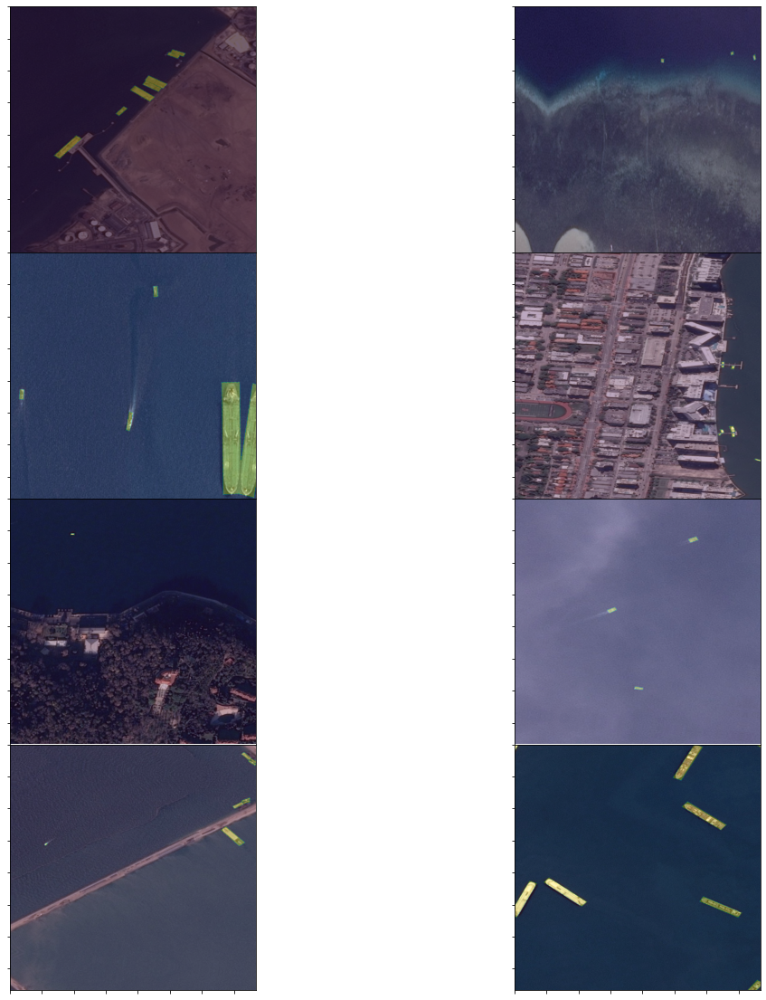

In [15]:
plot_img_batch2(gen_pp, nrows = 4, ncols = 2)

In [ ]:
model.summary()

In [ ]:
#BATCH_SIZE = 1

#weights_path = PATH

'''
model 4: epochs =  5
model 5: epochs = 20
    early stop after 11 epochs (accidentally overwritted by model 6)
model 6: uses model5, changed size of conv layers, changed epochs back to 5
    decent results, doesn't look as blurry as model 4 & 5
    shows more detail
    runs faster with fewer filters
model 7: uses model 7, which adds gaussian noise and batch normalization
    NOTE: errors found in model5, need to adjust number of filters
    need to try batch normalization and gaussian blur with model2
    looks like dice_coeff is still improving with epochs, try increasing epochs
model 8: epochs = 20
    good result
model 9: use model 8 (basically model2 with batch norm and gauss), 20 epochs
    looked like total shit
model 10: uses model9, fixed errors in number of filters
model 11: uses a batch_size of 32, 300 steps, 20 epochs
    returns results of almost no ships identified
    early stop after 13 epochs
    found typo in image_aug2: capped the output at 4
model 12: batch_size of 1, steps 100, epochs 5
    intended to try to get some result
    is batching the error?
model 13: batch_size 32, epochs 1, steps 200
    works decent
model 14: fucking ran out of memory in epoch 4
    steps = 300, epochs = 5, batch_size = 32
    checkpoints show no data
model 15: 1 epoch, 300 steps, batch_size 32
    checked load from checkpoints and model: all good!
model 16: batch size 16, steps 200, epochs 5
    all images are blank!
model 17: steps 200 epochs 5 batch_size 32
    got all fucked up because aws logged me out
model 18: steps = 500, batch_size = 20, epochs = 20
    added random shuffling
model 19: added random shuffling, random state to sampling, adjusted sampling weights
    deleted files < 50 kb
    saved pre-process df for faster loading
    steps 500. epochs 3. batch_size 20
    added sampling to training dataset
    PROBABLY THE BEST ONE YET
model 20: decent results with 1000 steps and 1 epoch
    uses resnet34
model 21: ran overnight, up to 0.47 val_iou_score
    cancelled after ~27 epochs (see log file)
    BEST RESULTS YET
    doesn't falsely identify clouds or land
model 22: crashed misteriously.  steps 625, epochs 100, batch 8
    decent results though.
model 23: crashed after 18 epochs
model 24: attempt to restart

    
'''

v = 24

checkpoint = ModelCheckpoint("checkpoints_v%d.out" % v, monitor='val_iou_score', 
                             verbose=1, save_best_only=True, mode='max')

csv_logger = CSVLogger("log_v%d.out" % v, append=True, separator=';')

earlystopping = EarlyStopping(monitor = 'val_iou_score', verbose = 1,
                              min_delta = 0.01, patience = 20, mode = 'max')

callbacks_list = [checkpoint, csv_logger, earlystopping]

STEPS = 625
EPOCHS = 100
BATCH_SIZE = 8

# REMEMBER TO GO BACK AND RUN V2 WITH df_sample
results = model_checkpoint.fit_generator(image_gen_batch_pp(df_sample, batch_size = BATCH_SIZE),
                          epochs = EPOCHS, 
                          steps_per_epoch = STEPS,
                          validation_data = image_gen_batch(df_sample_test, batch_size = BATCH_SIZE), 
                          validation_steps = STEPS,
                          callbacks = callbacks_list,
                          workers = 1)
model.save('Model_v%d.h5' % v)

def write_hist(hist, filename):
    f = open(filename, 'w')
    for x in hist.keys():
        vals = str(hist[x]).replace('[','').replace(']','')
        f.write(x + ',' + vals + '\n')
    f.close()
    
write_hist(results.history,"results%d_history.csv" % v)

Epoch 1/100
 75/625 [==>...........................] - ETA: 18:11 - loss: 0.5587 - iou_score: 0.4655

In [19]:
def show_predictions(model, n_pred, test_gen):
    fig = plt.figure(figsize = (15,n_pred*5))
    plt.subplots_adjust(wspace=0, hspace=0)
    for i in np.arange(n_pred):
        print("Predicting %d of %d" % (i, n_pred))
        valid_x, valid_y = next(test_gen)
        test_pred = model.predict(valid_x)
        ax1 = plt.subplot(n_pred, 3, i*3+1)
        ax1.imshow(np.reshape(valid_y[0],(768,768)))
        ax1.set_yticklabels([])
        ax1.set_xticklabels([])
        
        test_pred[test_pred > 0.5] = 1
        test_pred[test_pred <= 0.5] = 0
        ax2 = plt.subplot(n_pred, 3, i*3+2)
        ax2.imshow(np.reshape(test_pred[0],(768,768)))
        ax2.set_yticklabels([])
        ax2.set_xticklabels([])
        
        ax3 = plt.subplot(n_pred, 3, i*3+3)
        ax3.imshow(valid_x[0])
        ax3.set_yticklabels([])
        ax3.set_xticklabels([])

In [ ]:
test_gen = image_gen(df_test[df_test['count'] >= 2], print_name = True)
#plot_overlay(*next(test_gen))

show_predictions(model, 20, test_gen)

Predicting 0 of 20
80f68abdb.jpg
Predicting 1 of 20
311e90084.jpg
Predicting 2 of 20
c23d9ec7e.jpg
Predicting 3 of 20
83176c994.jpg
Predicting 4 of 20
1402afcf8.jpg
Predicting 5 of 20
3153e53de.jpg
Predicting 6 of 20
73ec7b6a0.jpg
Predicting 7 of 20
8f65e8b8a.jpg
Predicting 8 of 20
6dd427602.jpg
Predicting 9 of 20
f2a5fddec.jpg
Predicting 10 of 20
a71d6f9e7.jpg
Predicting 11 of 20
76b5f333c.jpg
Predicting 12 of 20
4e6a33105.jpg
Predicting 13 of 20
7b9e0e43c.jpg
Predicting 14 of 20
9fe284290.jpg
Predicting 15 of 20
7a7aa4d08.jpg
Predicting 16 of 20
d620d7836.jpg
Predicting 17 of 20
1bee031fb.jpg
Predicting 18 of 20
16f592068.jpg
Predicting 19 of 20
f7a2f1a6f.jpg


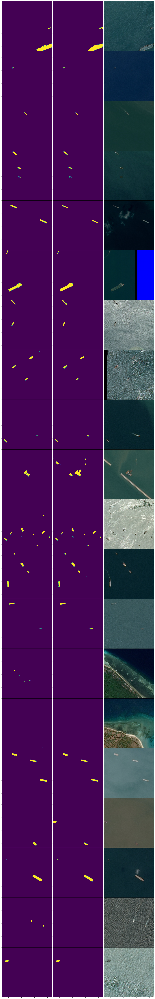

In [20]:
# LOAD FROM CHECKPOINT

# Create a new model instance
#model_checkpoint = model9.unet(input_size = np.shape(X_train)[1:])

model_checkpoint = Unet(BACKBONE, encoder_weights='imagenet')
model_checkpoint.compile('Adam', loss=bce_jaccard_loss, metrics=[iou_score])

# Restore the weights
model_checkpoint.load_weights('checkpoints_v24.out')
#m_checkpoint = m.load_weights("checkpoints_v14.out")

test_gen = image_gen(df_test[df_test['count'] >= 2], print_name = True)

show_predictions(model_checkpoint, 20, test_gen)

In [90]:
# create submission
n = 0
sub = pd.read_csv(PATH + 'sample_submission_v2.csv')
sub2 = sub.drop(sub.index)

for i,row in sub.iterrows():
    #print(row)

    img = np.array([skimage.io.imread(TEST_PATH + row['ImageId'])/255.0])
    test_pred = model_checkpoint.predict(img)
    test_pred_r = np.reshape(test_pred[0],(768,768))


    test_pred_r[test_pred_r > 0.5] = 1
    test_pred_r[test_pred_r <= 0.5] = 0
    
    row2 = row
    
    if np.sum(test_pred_r) >= 1:
        labels = measure.label(test_pred_r, background = 0)
        max_label = np.max(labels)
        #print("max_label: ", max_label)
        for a in np.arange(1,max_label +1):
            #print("a: ",a)
            tmp_image = np.copy(labels)
            tmp_image[tmp_image != a] = 0
            tmp_image[tmp_image == a] = 1
            rle = rle_encode(tmp_image)
            #print(rle)
            row2['EncodedPixels'] = rle
            sub2 = sub2.append(row2)
    else:
        row2['EncodedPixels'] = ''
        sub2 = sub2.append(row2)
    
    if n % 100 == 0:
        print(n)
    n += 1

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600


In [89]:
sub2.head(20)

,ImageId,EncodedPixels
0,00002bd58.jpg,
1,00015efb6.jpg,
2,00023d5fc.jpg,
3,000367c13.jpg,
4,0008ca6e9.jpg,
5,000a4635f.jpg,
6,000bd9dbf.jpg,420032 4 420800 5 421567 7 422335 8 423103 9 4...
7,000f7d875.jpg,
8,0010551d9.jpg,183033 16 183798 26 184564 31 185331 35 186098...
9,001839c6f.jpg,


In [70]:
for i,row in sub.iterrows():
    print(type(row))
    break

<class 'pandas.core.series.Series'>


In [91]:
sub2.to_csv('submission3.csv', index = False)

max_label:  3
a:  1
262761 7 263526 17 264294 19 265061 23 265828 27 266595 33 267362 36 268117 3 268129 39 268883 7 268896 42 269651 56 270419 58 271188 58 271957 57 272727 56 273498 54 274269 51 275041 47 275812 44 276582 42 277352 40 278121 39 278893 34 279675 19 280448 11
a:  2
110282 9 111048 13 111815 15 112582 17 113349 19 114116 21 114884 21 115651 23 116418 24 117185 25 117953 26 118720 27 119488 27 120256 26 121023 27 121791 27 122558 27 123326 27 124094 26 124862 25 125629 26 126397 25 127164 26 127932 25 128699 25 129466 26 130234 25 131002 25 131769 25 132537 25 133304 25 134072 25 134839 25 135606 26 136374 25 137141 26 137909 25 138676 26 139444 25 140211 26 140979 25 141746 26 142514 25 143281 25 144049 25 144816 25 145584 25 146351 25 147118 26 147886 25 148653 26 149421 25 150188 26 150956 25 151723 25 152490 26 153258 25 154025 25 154793 25 155560 25 156327 25 157095 24 157862 24 158630 23 159398 22 160166 21 160934 20 161702 20 162470 19 163238 19 164007 17 164775 1

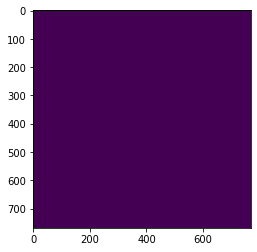

In [67]:
# validate output

from skimage import measure


#plt.imshow(np.reshape(test_pred[0],(768,768)))
#plt.imshow(labels)

img = np.array([skimage.io.imread(TEST_PATH + '00a3ab3cc.jpg')/255.0])
test_pred = model_checkpoint.predict(img)
test_pred_r = np.reshape(test_pred[0],(768,768))


test_pred_r[test_pred_r > 0.5] = 1
test_pred_r[test_pred_r <= 0.5] = 0

if np.sum(test_pred_r) >= 1:
    labels = measure.label(test_pred_r, background = 0)
    max_label = np.max(labels)
    print("max_label: ", max_label)
    for a in np.arange(1,max_label +1):
        print("a: ",a)
        tmp_image = np.copy(labels)
        tmp_image[tmp_image != a] = 0
        tmp_image[tmp_image == a] = 1
        rle = rle_encode(tmp_image)
        print(rle)
        
    

[]

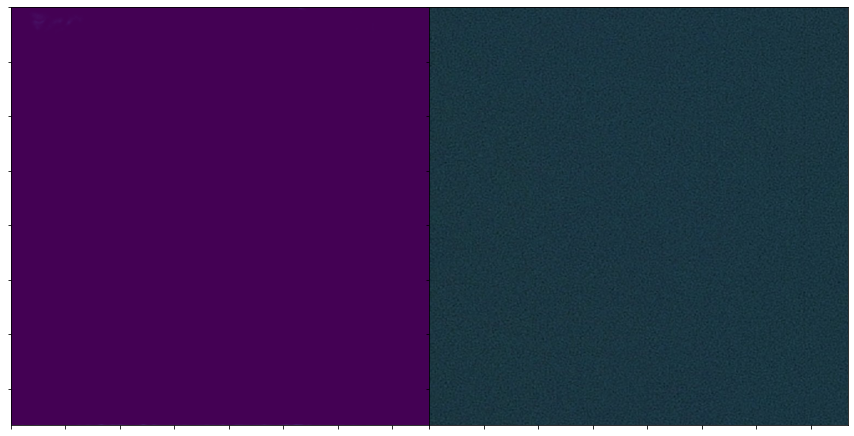

In [84]:
img = np.array([skimage.io.imread(TEST_PATH + '00002bd58.jpg')/255.0])
test_pred = model_checkpoint.predict(img)

fig = plt.figure(figsize = (15,30))
plt.subplots_adjust(wspace=0, hspace=0)


ax1 = plt.subplot(1, 2, 1)
ax1.imshow(np.reshape(test_pred[0],(768,768)))
ax1.set_yticklabels([])
ax1.set_xticklabels([])

ax2 = plt.subplot(1, 2, 2)
ax2.imshow(img[0])
ax2.set_yticklabels([])
ax2.set_xticklabels([])

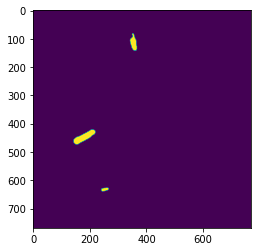

In [32]:
rle = rle_encode(test_pred)
drle = rle_decode(rle)
plt.imshow(drle)

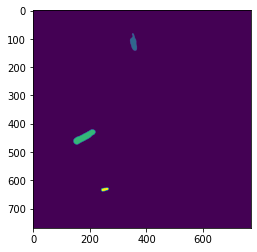

In [56]:


#max_label = max(labels)

#sub_new = sub.drop(sub.index)

In [57]:
np.unique(labels)

array([0, 1, 2, 3])

In [ ]:
for a in np.arange(max_label):
    tmp_image = labels
    tmp_image[tmp_image != a] = 0
    tmp_image[tmp_image == a] = 1
    rle(tmp_image)
    

In [21]:
import os
for file in os.listdir(TEST_PATH):
    print(file)
    break

1bd9d2803.jpg


In [ ]:
show_predictions(model_checkpoint, 20, test_gen)

In [ ]:
show_predictions(model_checkpoint, 20, test_gen)

In [ ]:
# LOAD FROM SAVED MODEL

from keras import models
import model2

# later try importing from model2
import keras.backend as K
from keras.losses import binary_crossentropy
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)
def dice_p_bce(in_gt, in_pred):
    return 1e-3*binary_crossentropy(in_gt, in_pred) - dice_coef(in_gt, in_pred)
def true_positive_rate(y_true, y_pred):
    return K.sum(K.flatten(y_true)*K.flatten(K.round(y_pred)))/K.sum(y_true)

# check that model was saved properly
mload = models.load_model('Model_v15.h5',
                      custom_objects = {'dice_p_bce' : dice_p_bce,
                                        'dice_coef' : dice_coef,
                                        'true_positive_rate' : true_positive_rate})


test_gen = image_gen(df_test[df_test['count'] >= 2], print_name = True)

show_predictions(mload, 8, test_gen)

In [ ]:
test_pred2 = model_checkpoint.predict(valid_x)
#fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (10,20))
#ax1.imshow(np.reshape(valid_y,(768,768)))
#ax2.imshow(np.reshape(test_pred2[0],(768,768)))
#3ax3.imshow(valid_x[0])

In [ ]:
show_predictions(model_checkpoint, 10, test_gen)

In [ ]:
#print(results7.history)
#dir(results7)

def plot_hist(results):
    fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize = (20,20))
    ax1.plot(results.history['loss'], label = 'loss')
    ax1.plot(results.history['val_loss'], label = 'val_loss')
    ax1.set_title('loss')
    
    ax2.plot(results.history['dice_coef'])
    ax2.plot(results.history['val_dice_coef'])
    ax2.set_title('dice_coef')
    
    ax3.plot(results.history['binary_accuracy'])
    ax3.plot(results.history['val_binary_accuracy'])
    ax3.set_title('binary_accuracy')
    
    ax4.plot(results.history['true_positive_rate'])
    ax4.plot(results.history['val_true_positive_rate'])
    ax4.set_title('true_positive_rate')

    
plot_hist(results10)